In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('./input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

ModuleNotFoundError: No module named 'pandas'

# Playing the video

In [2]:
from IPython.display import HTML
from base64 import b64encode

def play(filename):
    html = ''
    video = open(filename,'rb').read()
    src = 'data:video/mp4;base64,' + b64encode(video).decode()
    html += '<video width=600 controls autoplay loop><source src="%s" type="video/mp4"></video>' % src 
    return HTML(html)

# play('/kaggle/input/tvsum-videos/EE-bNr36nyA.mp4')
play('./input/-esJrBWj2d8.mp4')

In [3]:
!rm -rf /kaggle/working/*

In [4]:
import os

# Get the current directory
current_directory = os.getcwd()

# Loop through all files in the current directory
for filename in os.listdir(current_directory):
    # Check if the file ends with .jpg
    if filename.lower().endswith('.jpg'):
        # Construct full file path
        file_path = os.path.join(current_directory, filename)
        # Delete the file
        os.remove(file_path)
        print(f'Deleted: {file_path}')

In [5]:
import cv2
import os

video_path = './input/-esJrBWj2d8.mp4'
output_dir = './output/frames'

os.makedirs(output_dir, exist_ok=True)

cam = cv2.VideoCapture(video_path)
total_frames = int(cam.get(cv2.CAP_PROP_FRAME_COUNT))

for i in range(total_frames):
    ret, frame = cam.read()

    if not ret:
        break

    cv2.imwrite(os.path.join(output_dir, "{}.jpg".format(i)), frame)

cam.release()


Printing All Frames

In [6]:
# import os
# import glob
# import IPython
# from IPython.display import display, Image

# # Path to the frames directory
# frames_dir = './output/frames'

# # Get a list of all JPEG files in the directory
# frame_files = glob.glob(os.path.join(frames_dir, '*.jpg'))
# print(f'Total frames found: {len(frame_files)}')

# # Display each image
# for frame_file in frame_files:
#     print(f'Displaying: {frame_file}')
#     image = Image(filename=frame_file)
#     display(image)


Plotting Intensity Difference for Keyframes

In [7]:
import os
import glob
import cv2
import numpy as np
import matplotlib.pyplot as plt

frames_dir = './output/frames/'

frame_files = glob.glob(os.path.join(frames_dir, '*.jpg'))
print(f'Total frames found: {len(frame_files)}')

intensity_differences = []

for i in range(len(frame_files) - 1):
    frame1 = cv2.imread(frames_dir+str(i)+'.jpg')
    frame2 = cv2.imread(frames_dir+str(i+1)+'.jpg')
    
    gray1 = cv2.cvtColor(frame1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(frame2, cv2.COLOR_BGR2GRAY)
    
    diff = cv2.absdiff(gray1, gray2)

    intensity_sum = np.sum(diff)
    intensity_differences.append(intensity_sum)




Total frames found: 6912


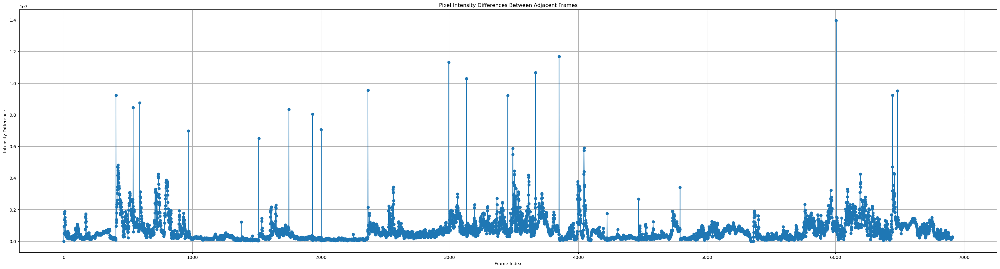

In [8]:
plt.figure(figsize=(40, 10))
plt.plot(intensity_differences, marker='o')
plt.title('Pixel Intensity Differences Between Adjacent Frames')
plt.xlabel('Frame Index')
plt.ylabel('Intensity Difference')
plt.grid()
plt.show()

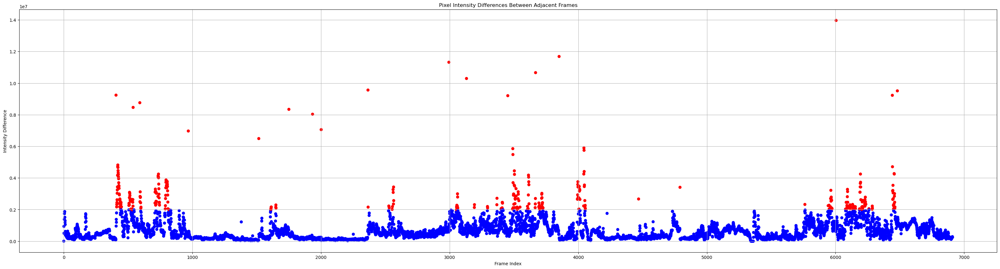

In [9]:
def plot_with_highlights(intensity_differences, highlight_percent,candf):
    # Calculate the threshold value for highlighting
    threshold_value = np.percentile(intensity_differences, 100 - highlight_percent)
    
    # Create a color array for the plot
    colors=[]
    for i in range(len(intensity_differences)):
        value = intensity_differences[i]
        if value >= threshold_value:
            candf.append(i)
            colors.append('red')
        else:
            colors.append('blue')



    # colors = ['red' if value >= threshold_value else 'blue' for value in intensity_differences]

    # Plot the intensity differences with highlighted peaks
    plt.figure(figsize=(40, 10))
    plt.scatter(range(len(intensity_differences)), intensity_differences, color=colors, marker='o')
    plt.title('Pixel Intensity Differences Between Adjacent Frames')
    plt.xlabel('Frame Index')
    plt.ylabel('Intensity Difference')
    plt.grid()
    plt.show()
candf=[]
highlight_percent = 5
plot_with_highlights(intensity_differences, highlight_percent,candf)

# Getting CandF SW 


In [10]:
print("Number of Total Frames: ",len(frame_files),"\nNumber of Chosen Candidate Frame",len(candf))

Number of Total Frames:  6912 
Number of Chosen Candidate Frame 346


# Converting to DCT and clustering using OPTICS

In [11]:
import cv2
import numpy as np
from sklearn.cluster import OPTICS
from sklearn.preprocessing import StandardScaler
from scipy.fftpack import dct

def apply_dct(image_vector):
    # Apply 1D DCT to the image vector
    return dct(image_vector, norm='ortho')

# Load your images into feature_vectors
# Example: feature_vectors = [cv2.imread(img_path).flatten() for img_path in candf]
feature_vectors = [cv2.imread('./output/frames/'+str(img_num)+'.jpg', cv2.IMREAD_GRAYSCALE).flatten() for img_num in candf]

# Standardize the feature vectors
scaler = StandardScaler()
feature_vectors_standardized = scaler.fit_transform(feature_vectors)

# Apply DCT
dct_vectors = np.apply_along_axis(apply_dct, 1, feature_vectors_standardized)

# Fit OPTICS
optics = OPTICS()
clusters = optics.fit_predict(dct_vectors)

print("Clusters:", clusters)


Clusters: [-1 13 13 13 13 13 13 13 13 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  3  3  3  3 -1  3 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1  2  2  2  2  2  2 -1 -1 -1 -1 -1 -1 -1 -1 -1  1  1  1  1
  1  1  1  1  1  1  1  1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 12 12 12 12
 12 12 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1  0  0  0
  0  0  0  0  0 -1 -1 -1 -1 15 15 15 15 15 15 15 15 15 -1 18 18 18 18 18
 18 18 18 18 -1 -1 -1 -1 -1 -1 -1 10 10 10 10 10 10 -1 -1 -1 -1 -1 -1 -1
  8  8  8  8  8  9  9  9  9  9  9  9  9  9  9  9 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 11 11 11 11 11 11 11 11  6  6  6  6  6
  6  6  6  6 -1 -1 -1 -1 -1 17 17 17 17 17 17 -1 -1 -1 -1 -1 -1 -1 -1 -1
 -1 -1 -1 -1 -1 -1 17 17 17 17 -1 -1 19 -1 -1 -1 19 19 19 19 19 19 19 19
 19 19 19 19 19 -1 -1  4  4  4  4  4  4 -1 -1 -1  5  5  5  5  5 -1 -1 -1
 -1  7  7  7  7  7 -1 -1 14 14 14 14 14 14 -1 16 16 16 16 16 16 16 16 16
 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -1 -

# Printing Clusters

In [12]:
import IPython.display

def imagedisplayer(filename_str):
    full_path = './output/frames/' + filename_str
    image = IPython.display.Image(filename=full_path)
    display(image)

def clusterprinter(clusters, k):
    global keyf
    temp = []
    for i in range(len(clusters)):
        if clusters[i] == k:
            # imagedisplayer(str(candf[i])+".jpg")
            temp.append(str(candf[i]) + ".jpg")
    
    if temp:
        middle_index = int(len(temp) / 2)
        keyf.append(temp[middle_index])

keyf = []
for i in range(max(clusters) + 1):
    print("CLUSTER:", i)
    
    clusterprinter(clusters, i)


CLUSTER: 0
CLUSTER: 1
CLUSTER: 2
CLUSTER: 3
CLUSTER: 4
CLUSTER: 5
CLUSTER: 6
CLUSTER: 7
CLUSTER: 8
CLUSTER: 9
CLUSTER: 10
CLUSTER: 11
CLUSTER: 12
CLUSTER: 13
CLUSTER: 14
CLUSTER: 15
CLUSTER: 16
CLUSTER: 17
CLUSTER: 18
CLUSTER: 19


# Cluster Centroid for Keyframes

Displaying image: 1648.jpg


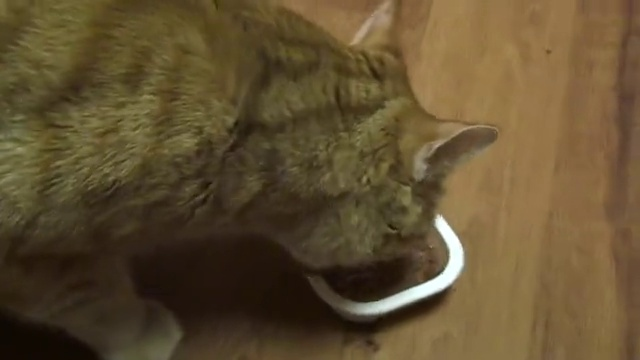

Displaying image: 717.jpg


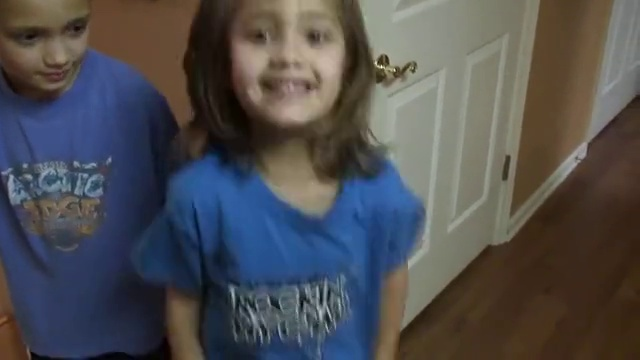

Displaying image: 537.jpg


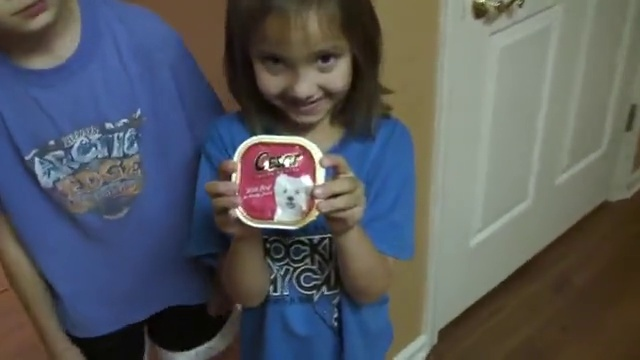

Displaying image: 508.jpg


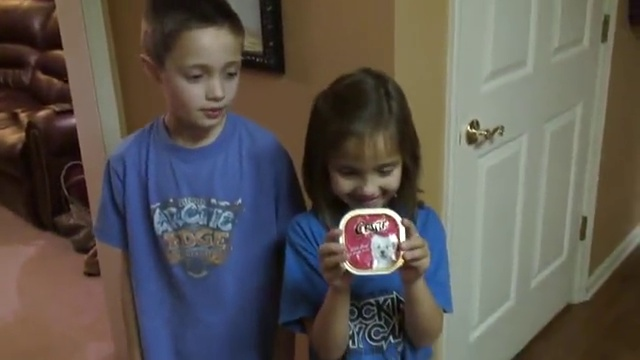

Displaying image: 6091.jpg


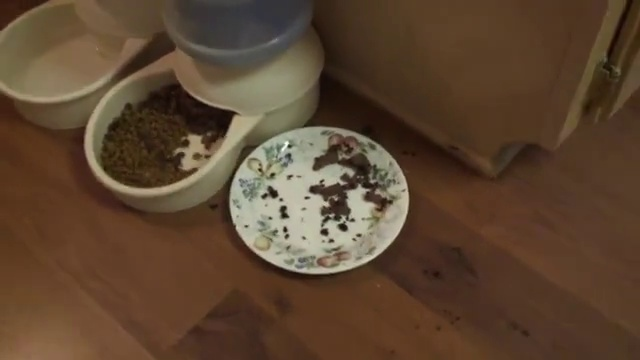

Displaying image: 6109.jpg


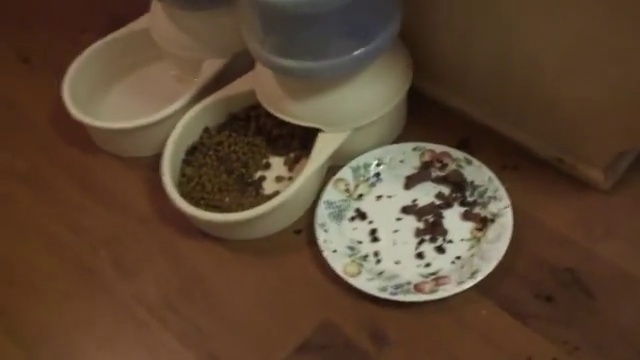

Displaying image: 3718.jpg


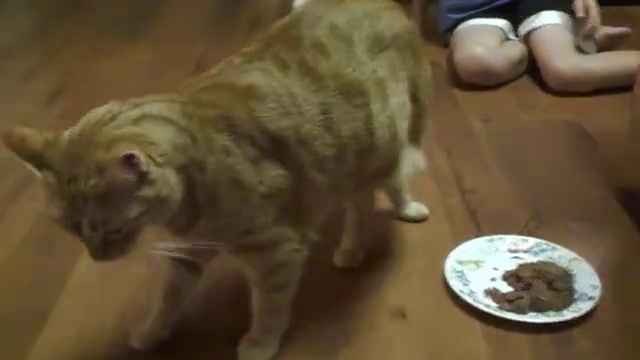

Displaying image: 6140.jpg


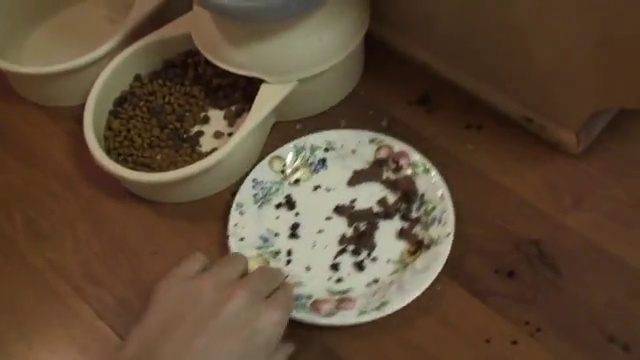

Displaying image: 3499.jpg


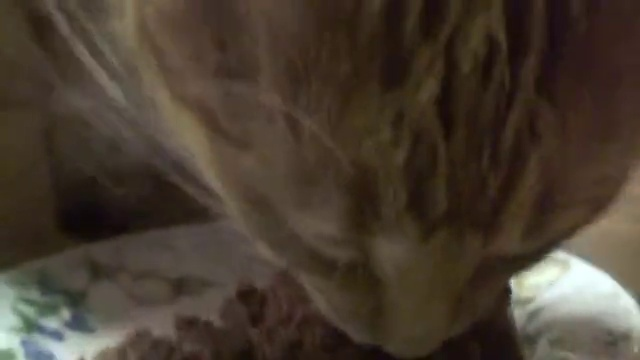

Displaying image: 3510.jpg


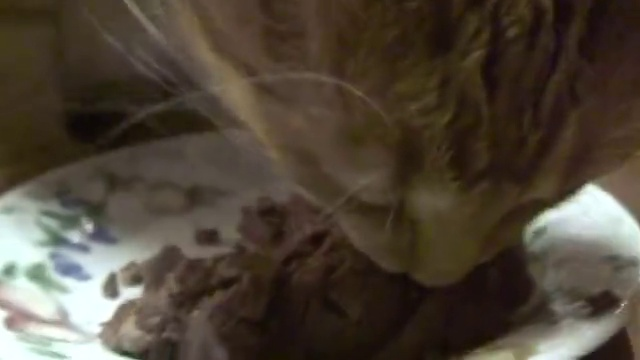

Displaying image: 3409.jpg


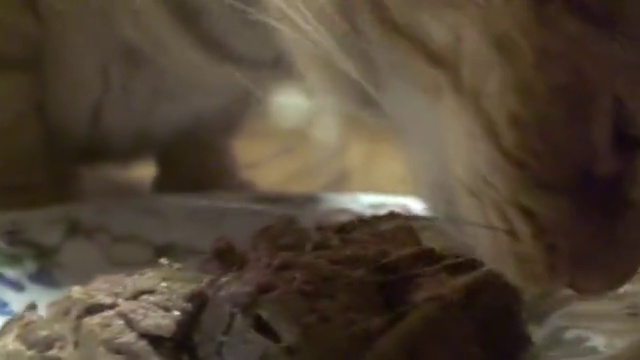

Displaying image: 3697.jpg


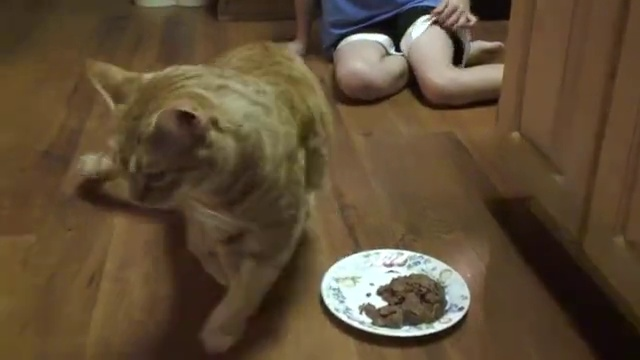

Displaying image: 792.jpg


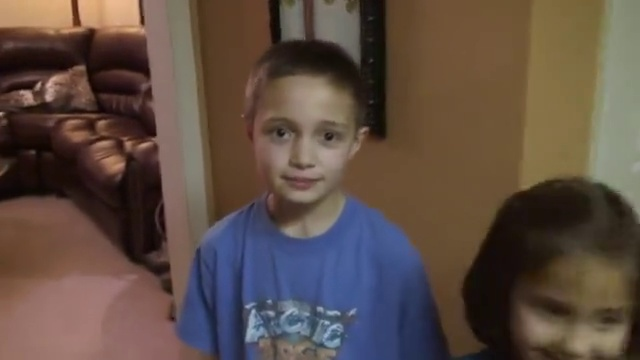

Displaying image: 415.jpg


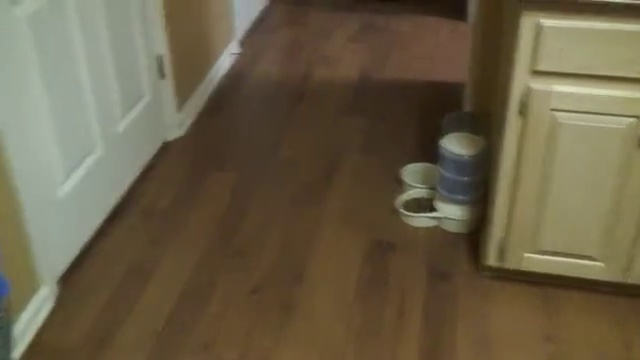

Displaying image: 6192.jpg


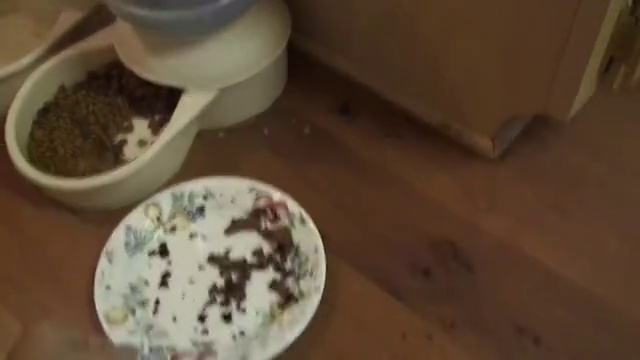

Displaying image: 2560.jpg


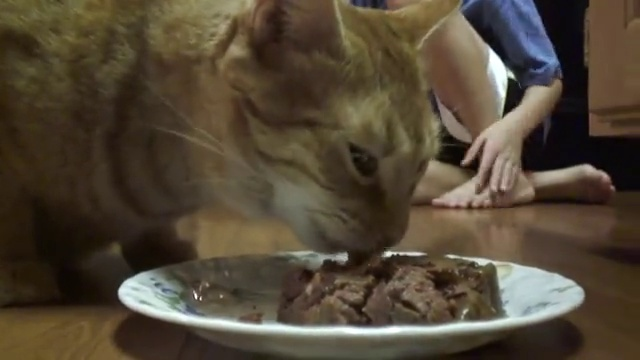

Displaying image: 6208.jpg


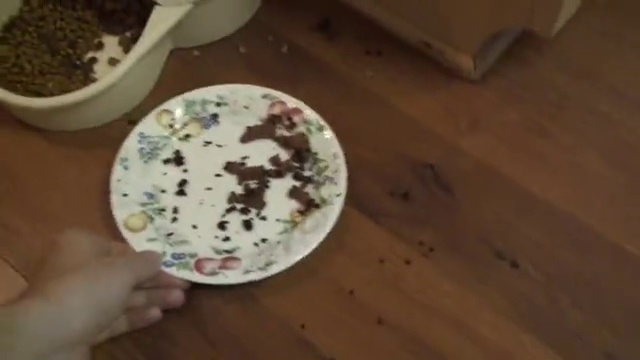

Displaying image: 4000.jpg


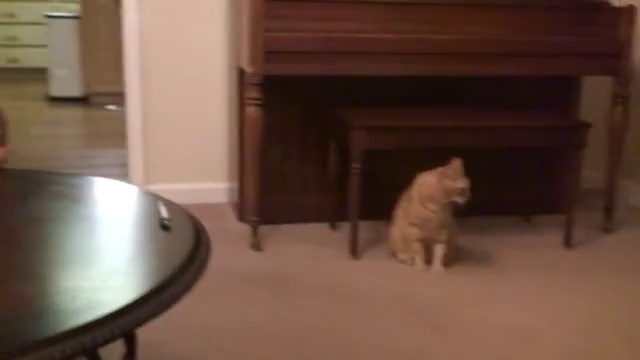

Displaying image: 3057.jpg


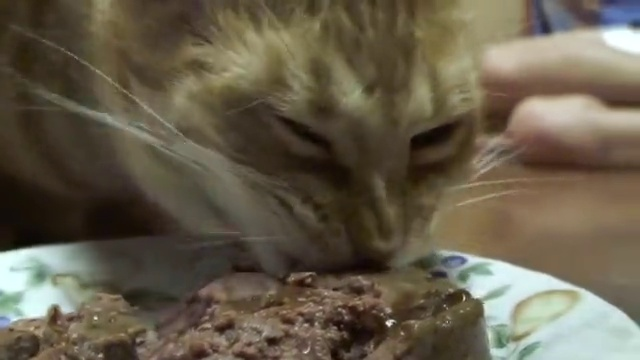

Displaying image: 5966.jpg


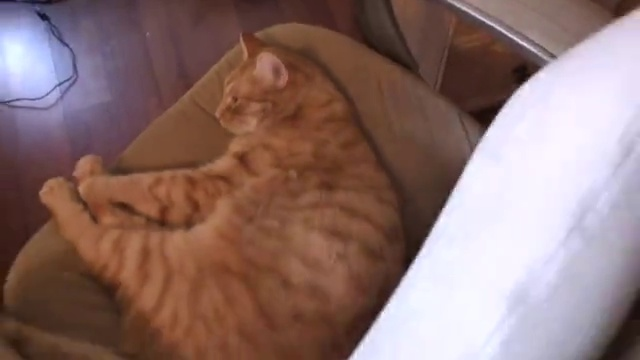

In [13]:
for file in keyf:
    print("Displaying image:", file)
    imagedisplayer(str(file))

In [14]:
from transformers import pipeline; print(pipeline('sentiment-analysis')('we love you'))

/home/rian-pinto/.local/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
2024-10-15 21:57:35.705946: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2024-10-15 21:57:35.723182: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-10-15 21:57:35.742748: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-10-15 21:57:35.748863:

[{'label': 'POSITIVE', 'score': 0.9998704195022583}]


In [15]:
from transformers import VisionEncoderDecoderModel, ViTImageProcessor, AutoTokenizer
import torch
from PIL import Image

model = VisionEncoderDecoderModel.from_pretrained("nlpconnect/vit-gpt2-image-captioning")

VisionEncoderDecoderModel has generative capabilities, as `prepare_inputs_for_generation` is explicitly overwritten. However, it doesn't directly inherit from `GenerationMixin`. From 👉v4.50👈 onwards, `PreTrainedModel` will NOT inherit from `GenerationMixin`, and this model will lose the ability to call `generate` and other related functions.
  - If you're using `trust_remote_code=True`, you can get rid of this warning by loading the model with an auto class. See https://huggingface.co/docs/transformers/en/model_doc/auto#auto-classes
  - If you are the owner of the model architecture code, please modify your model class such that it inherits from `GenerationMixin` (after `PreTrainedModel`, otherwise you'll get an exception).
  - If you are not the owner of the model architecture class, please contact the model code owner to update it.


./output/frames/
Captioning image: 1648.jpg


The attention mask is not set and cannot be inferred from input because pad token is same as eos token. As a consequence, you may observe unexpected behavior. Please pass your input's `attention_mask` to obtain reliable results.
We strongly recommend passing in an `attention_mask` since your input_ids may be padded. See https://huggingface.co/docs/transformers/troubleshooting#incorrect-output-when-padding-tokens-arent-masked.
You may ignore this warning if your `pad_token_id` (50256) is identical to the `bos_token_id` (50256), `eos_token_id` (50256), or the `sep_token_id` (None), and your input is not padded.


['a cat standing on top of a wooden floor next to a bowl']


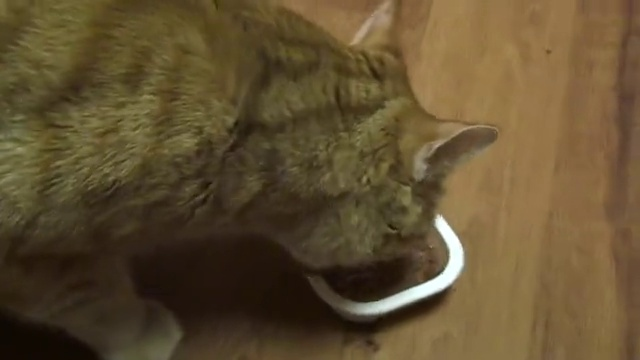

./output/frames/
Captioning image: 717.jpg
['two young boys standing in front of a door']


Error during conversion: ChunkedEncodingError(ProtocolError("Connection broken: InvalidChunkLength(got length b'', 0 bytes read)", InvalidChunkLength(got length b'', 0 bytes read)))
Error while downloading from https://cdn-lfs.hf.co/nlpconnect/vit-gpt2-image-captioning/5b9636ee2fca3459540d9bed46fe49c85d9d169b0388d5f029cdf4f50e1575ce?response-content-disposition=inline%3B+filename*%3DUTF-8%27%27model.safetensors%3B+filename%3D%22model.safetensors%22%3B&Expires=1729268922&Policy=eyJTdGF0ZW1lbnQiOlt7IkNvbmRpdGlvbiI6eyJEYXRlTGVzc1RoYW4iOnsiQVdTOkVwb2NoVGltZSI6MTcyOTI2ODkyMn19LCJSZXNvdXJjZSI6Imh0dHBzOi8vY2RuLWxmcy5oZi5jby9ubHBjb25uZWN0L3ZpdC1ncHQyLWltYWdlLWNhcHRpb25pbmcvNWI5NjM2ZWUyZmNhMzQ1OTU0MGQ5YmVkNDZmZTQ5Yzg1ZDlkMTY5YjAzODhkNWYwMjljZGY0ZjUwZTE1NzVjZT9yZXNwb25zZS1jb250ZW50LWRpc3Bvc2l0aW9uPSoifV19&Signature=Vsrgp-RGUDpM7%7EtbMA%7E5hKcYSXoeZvK4aJK1SFDokXv6mr8rSEYNv9o4UOC2%7Elmbk0mtm6jgNHFCpR1fgNDWsdyc4LDnRntyhssxeZzSSjZAXPDc8so7o6mr-8pkns5HRVmG9ofgw-LKMqsi3%7EJn505UO1gSfxOTIdye2s6fCBZEuuZ

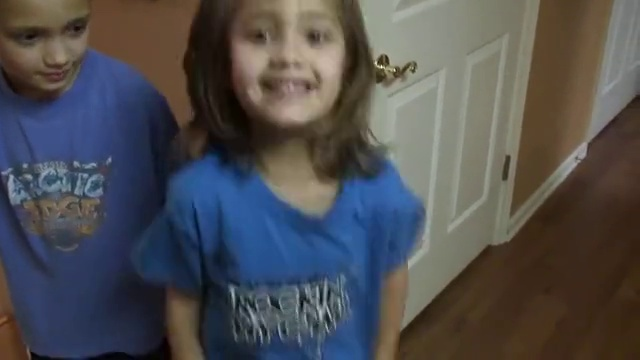

./output/frames/
Captioning image: 537.jpg
['a young girl holding a birthday cake with a smiley face']


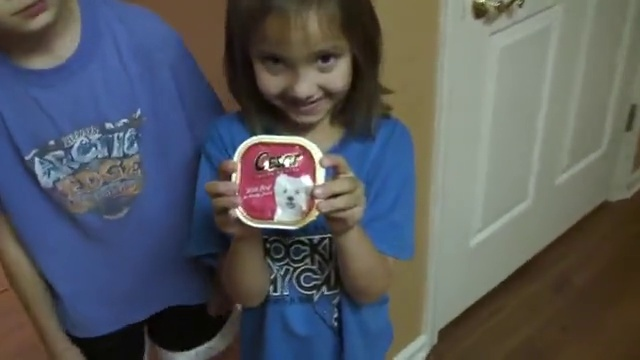

./output/frames/
Captioning image: 508.jpg
['a little girl standing next to a little boy holding a cake']


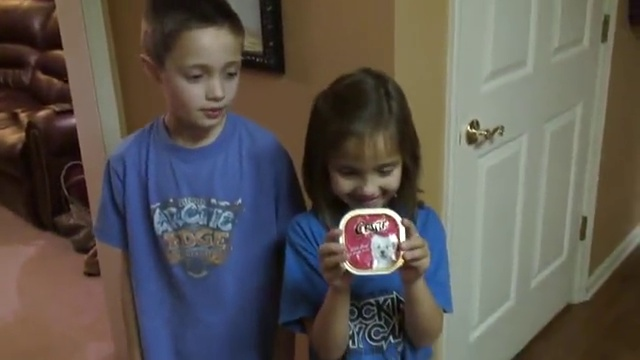

./output/frames/
Captioning image: 6091.jpg
['a bowl of food on a wooden table']


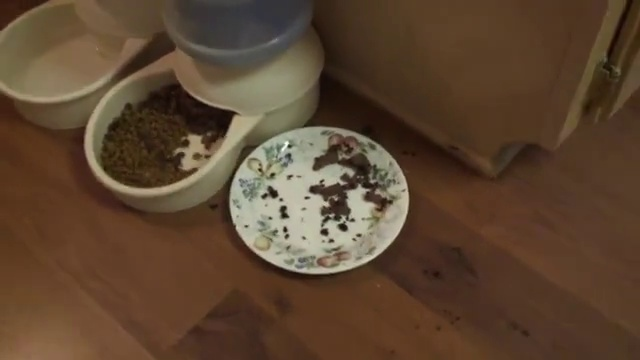

./output/frames/
Captioning image: 6109.jpg
['a bowl of food on a wooden table']


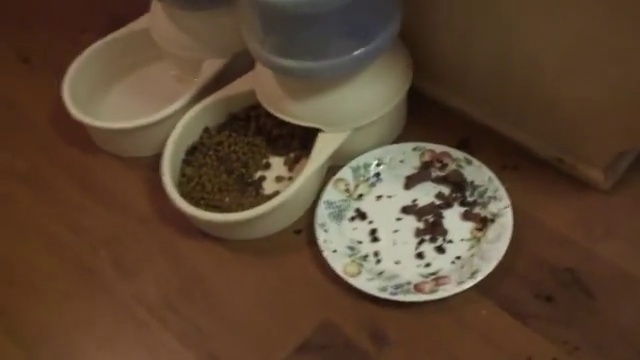

./output/frames/
Captioning image: 3718.jpg
['a cat sitting on a wooden floor next to a plate of food']


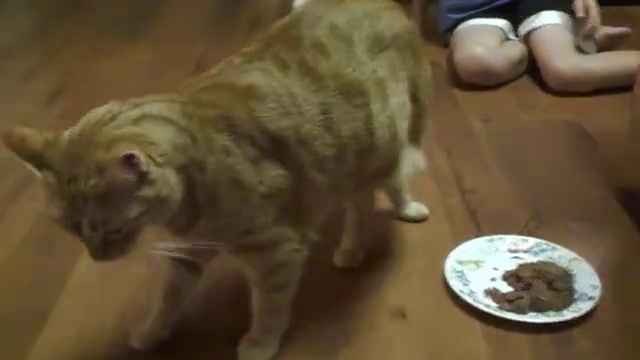

./output/frames/
Captioning image: 6140.jpg
['a person cutting a cake with a spoon']


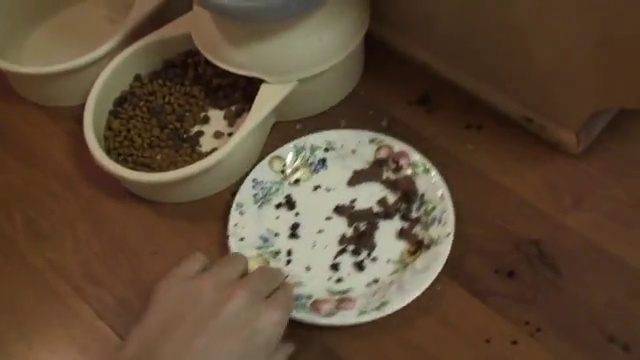

./output/frames/
Captioning image: 3499.jpg
['a close up picture of a brown and white animal']


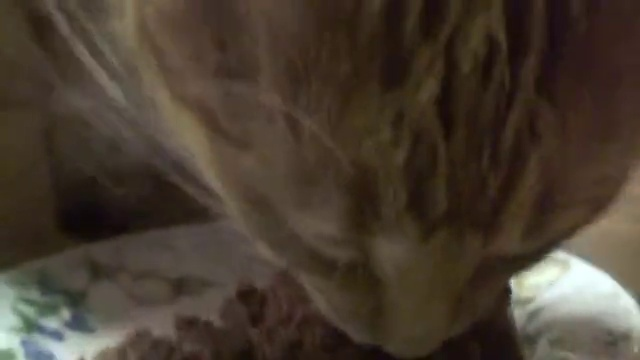

./output/frames/
Captioning image: 3510.jpg
['a brown dog eating a piece of chocolate cake']


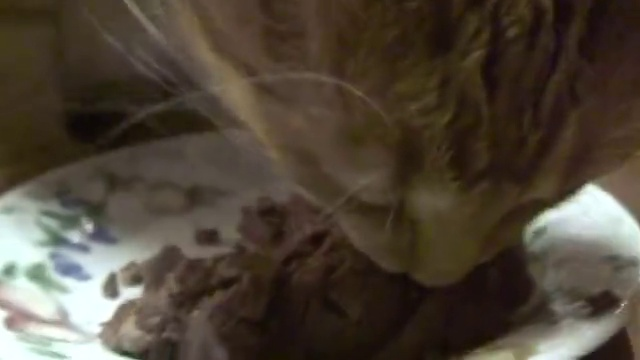

./output/frames/
Captioning image: 3409.jpg
['a cat is eating a piece of cake']


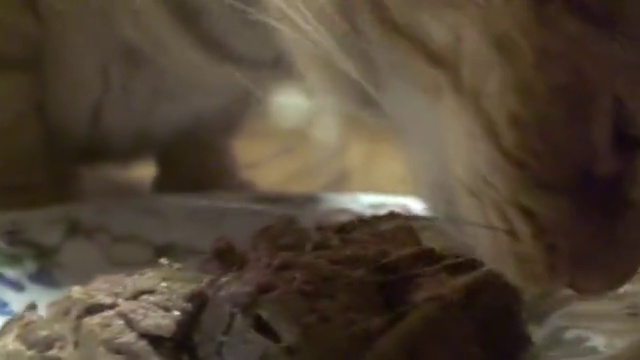

./output/frames/
Captioning image: 3697.jpg
['a cat sitting on the floor next to a plate of food']


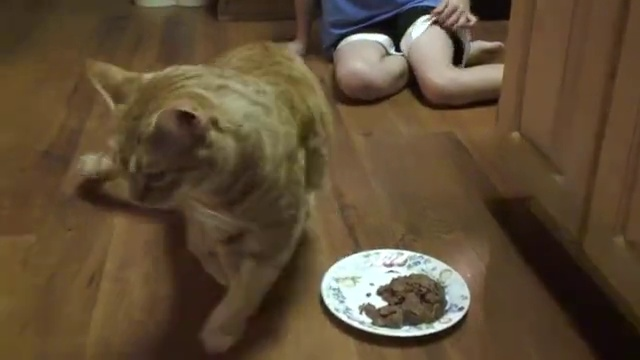

./output/frames/
Captioning image: 792.jpg
['two young boys standing next to each other in a living room']


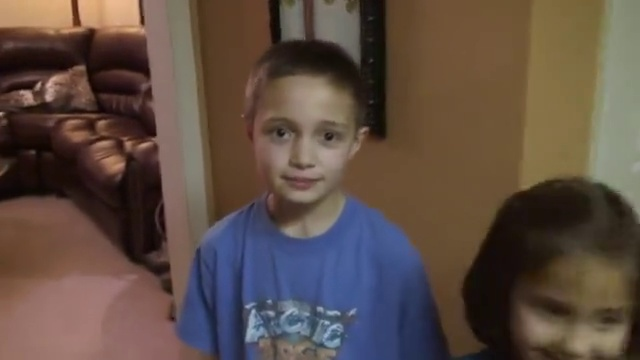

./output/frames/
Captioning image: 415.jpg
['a small room with a wooden floor and a black and white floor']


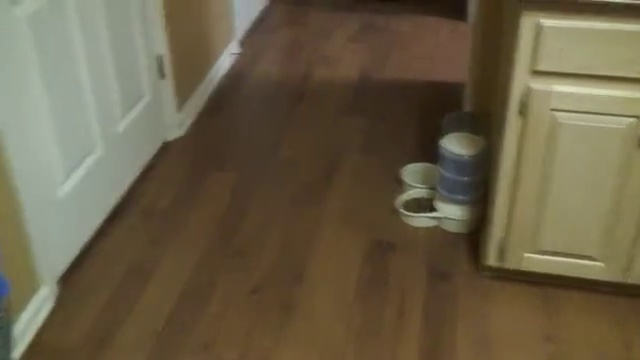

./output/frames/
Captioning image: 6192.jpg
['a bowl of food is sitting on the floor']


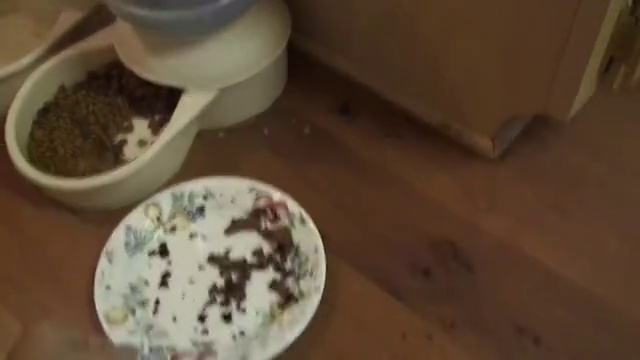

./output/frames/
Captioning image: 2560.jpg
['a cat eating a piece of cake on a plate']


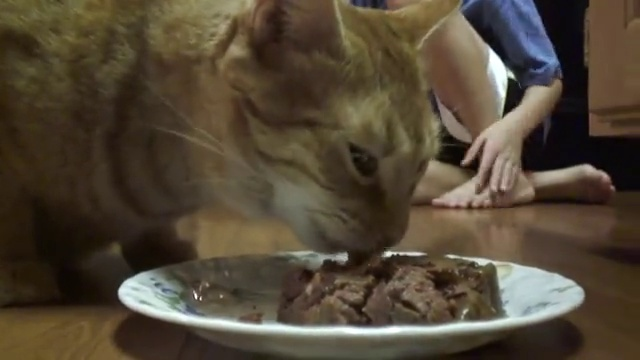

./output/frames/
Captioning image: 6208.jpg
['a plate of food on a table']


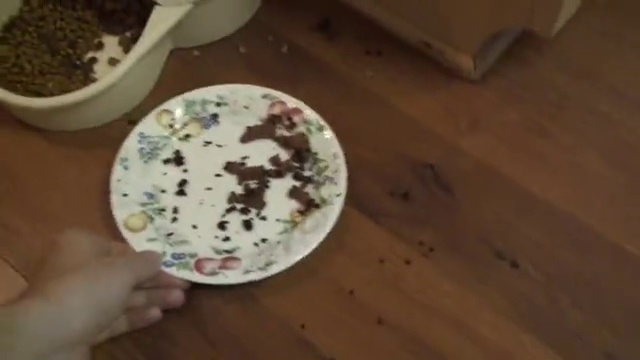

./output/frames/
Captioning image: 4000.jpg
['a dog sitting in a living room next to a piano']


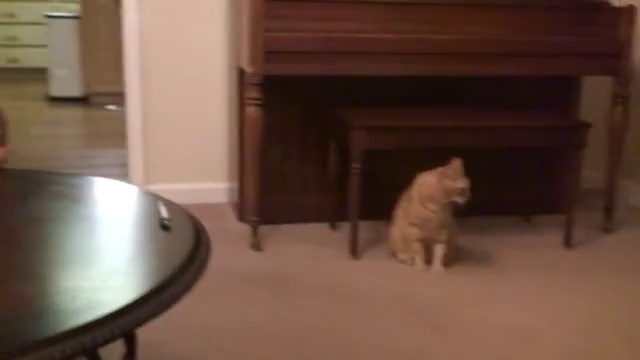

./output/frames/
Captioning image: 3057.jpg
['a cat eating a piece of cake on a plate']


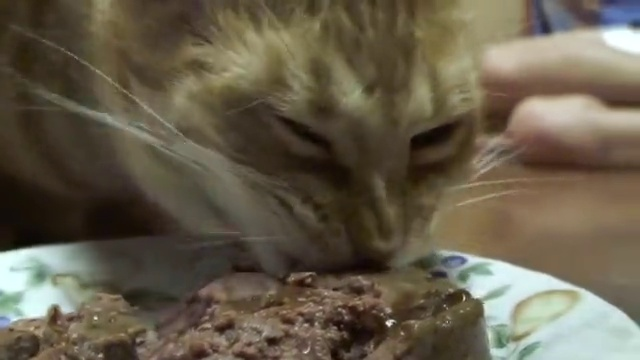

./output/frames/
Captioning image: 5966.jpg
['a cat laying on top of a blanket in a room']


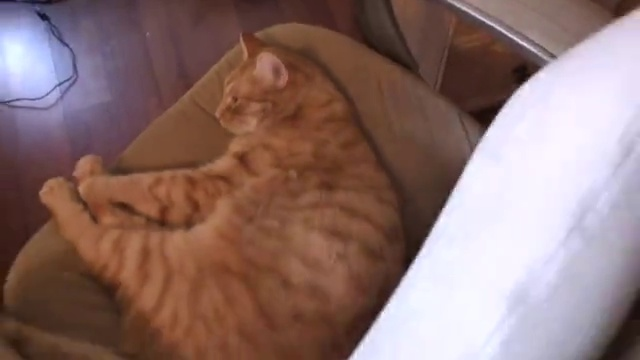

a cat standing on top of a wooden floor next to a bowl. two young boys standing in front of a door. a young girl holding a birthday cake with a smiley face. a little girl standing next to a little boy holding a cake. a bowl of food on a wooden table. a bowl of food on a wooden table. a cat sitting on a wooden floor next to a plate of food. a person cutting a cake with a spoon. a close up picture of a brown and white animal. a brown dog eating a piece of chocolate cake. a cat is eating a piece of cake. a cat sitting on the floor next to a plate of food. two young boys standing next to each other in a living room. a small room with a wooden floor and a black and white floor. a bowl of food is sitting on the floor. a cat eating a piece of cake on a plate. a plate of food on a table. a dog sitting in a living room next to a piano. a cat eating a piece of cake on a plate. a cat laying on top of a blanket in a room. 


In [16]:
feature_extractor = ViTImageProcessor.from_pretrained("nlpconnect/vit-gpt2-image-captioning")
tokenizer = AutoTokenizer.from_pretrained("nlpconnect/vit-gpt2-image-captioning")

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)
image_path =  './output/frames/'

global_captions=""
max_length = 16
num_beams = 4
gen_kwargs = {"max_length": max_length, "num_beams": num_beams}
def predict_step(image_paths):
  global global_captions
  images = []
  for image_path in image_paths:
    i_image = Image.open(image_path)
    if i_image.mode != "RGB":
      i_image = i_image.convert(mode="RGB")

    images.append(i_image)

  pixel_values = feature_extractor(images=images, return_tensors="pt").pixel_values
  pixel_values = pixel_values.to(device)

  output_ids = model.generate(pixel_values, **gen_kwargs)

  preds = tokenizer.batch_decode(output_ids, skip_special_tokens=True)
  preds = [pred.strip() for pred in preds]
  global_captions += ". ".join(preds) + ". "  # Convert list of captions to string and concatenate

  print(preds)
  return preds

for file in keyf:
        print(image_path)
        print("Captioning image:", file)
        predict_step([image_path +str(file)]) 
        imagedisplayer(str(file))
print(global_captions)

In [17]:
!pip install git+https://github.com/huggingface/transformers.git --break-system-packages

huggingface/tokenizers: The current process just got forked, after parallelism has already been used. Disabling parallelism to avoid deadlocks...
To disable this warning, you can either:
	- Avoid using `tokenizers` before the fork if possible
	- Explicitly set the environment variable TOKENIZERS_PARALLELISM=(true | false)


Defaulting to user installation because normal site-packages is not writeable
  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-hmoqd3fx
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-hmoqd3fx
  Resolved https://github.com/huggingface/transformers.git to commit 0f49deacbff3e57cde45222842c0db6375e4fa43
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


In [18]:
from transformers import pipeline

In [19]:
summarizer = pipeline("summarization",model="facebook/bart-large-cnn")


In [20]:
s=summarizer(global_captions, max_length=100, min_length=0, do_sample=False)


# **Visual Summary**

In [21]:
print(s[0]['summary_text'])

A close up picture of a brown and white animal. a young girl holding a birthday cake with a smiley face. a bowl of food on a wooden table. two young boys standing in front of a door.
